In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import library

In [1]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tqdm.notebook import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer, BatchNormalization
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional, SimpleRNN, Attention
from tensorflow.keras.applications import VGG16, DenseNet201
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_pre_input
from tensorflow.keras.applications.densenet import preprocess_input as densenet_pre_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from textwrap import wrap
import pickle

# Read data

In [2]:
image_path = '/content/drive/MyDrive/Deep Learning/MidTerm/Images/'
WORKING_DIR = '/content/drive/MyDrive/Deep Learning/MidTerm'
BASE_DIR = '/content/drive/MyDrive/Deep Learning/MidTerm'

In [3]:
data = pd.read_csv("/content/drive/MyDrive/Deep Learning/MidTerm/captions.txt")
data.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


# Show image & caption

In [4]:
def readImage(path,img_size=224):
    img = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
    img = img_to_array(img)
    img = img/255.
    
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.7, wspace = 0.3)
        image = readImage(image_path+temp_df.image[i])
        plt.imshow(image)
        plt.title("\n".join(wrap(temp_df.caption[i], 20)))
        plt.axis("off")

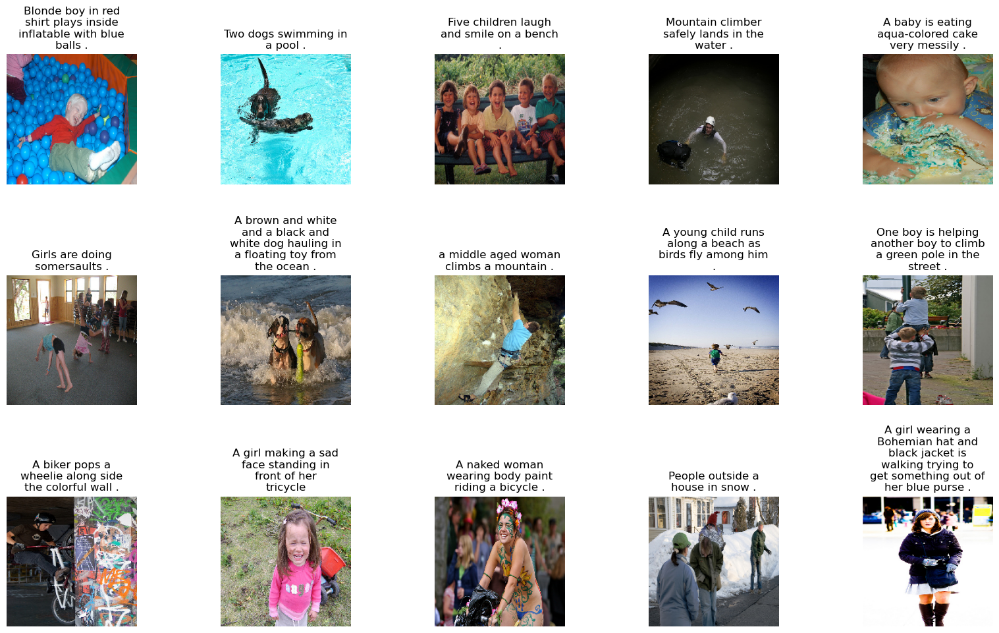

In [ ]:
display_images(data.sample(15))

# Preprocessed Text

In [5]:
def text_preprocessing(data):
    data['caption'] = data['caption'].apply(lambda x: x.lower())
    data['caption'] = data['caption'].apply(lambda x: x.replace("[^A-Za-z]",""))
    data['caption'] = data['caption'].apply(lambda x: x.replace("\s+"," "))
    data['caption'] = data['caption'].apply(lambda x: " ".join([word for word in x.split() if len(word)>1]))
    data['caption'] = "startseq "+data['caption']+" endseq"
    return data

In [6]:
data = text_preprocessing(data)
captions = data['caption'].tolist()
captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [7]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions)
vocab_size = len(tokenizer.word_index) + 1
max_length = max(len(caption.split()) for caption in captions)
print(vocab_size, max_length)
images = data['image'].unique().tolist()

nimages = len(images)
def split_train_test(data, test_size, val_size):
    return data[:test_size], data[test_size:test_size+val_size], data[test_size+val_size:]
size_val, size_test = int(nimages*0.1), int(nimages*0.1)
#split_index = round(split_index_train_test*0.2)
#train_data = images[:split_index_train_test] #0.9
#test_images = images[split_index_train_test:] #0.1

#train_images = train_data[:len(train_data)-split_index]
#val_images = train_data[len(train_data)-split_index:] #0.2 of train

test_images, val_images, train_images = split_train_test(images, size_test, size_val)

train = data[data['image'].isin(train_images)]
validation = data[data['image'].isin(val_images)]
test = data[data['image'].isin(test_images)]

train.reset_index(inplace=True,drop=True)
test.reset_index(inplace=True,drop=True)
validation.reset_index(inplace=True,drop=True)

tokenizer.texts_to_sequences([captions[1]])[0]

8485 34


[1, 18, 315, 63, 195, 116, 2]

In [ ]:
print(len(train_images), len(test_images), len(val_images))

6473 809 809


# Encoder

## Extract features (VGG16 & DenseNet201)

In [ ]:
def features_extraction(model):
    model_name = model.name
    model = Model(inputs=model.input, outputs=model.layers[-2].output)
    img_size = 224
    features = {}
    directory=os.path.join(BASE_DIR,'Images')
    for img_name in tqdm(os.listdir(directory)):
        #load the image from file
        img_path=directory+'/'+img_name
        image=load_img(img_path,target_size=(img_size,img_size,3))
        #convert image pixels to numpy array
        image=img_to_array(image)
        image=image.reshape((1,image.shape[0],image.shape[1],image.shape[2]))
        #preporocess image for model
        image = vgg_pre_input(image) if (model_name == 'vgg16') else densenet_pre_input(image)
        #extract features
        feature=model.predict(image,verbose=0)
        #get image id
        image_id=img_name
        #store_features
        features[image_id]=feature
    # store features in pickle
    pickle.dump(features,open(os.path.join(WORKING_DIR,'features_'+model_name+'.pkl'),'wb'))
    return 'features_'+model_name+'.pkl'

In [ ]:
features_VGG16 = features_extraction(VGG16(weights = 'imagenet'))

In [ ]:
features_DenseNet201 = features_extraction(DenseNet201(weights = 'imagenet'))

In [8]:
features_VGG16 = 'features_vgg16.pkl'
features_DenseNet = 'features_densenet201.pkl'

In [9]:
# load features from pickle VGG16
with open(os.path.join(WORKING_DIR,features_VGG16),'rb') as f:
    featuresVGG16=pickle.load(f)
# DenseNet201
with open(os.path.join(WORKING_DIR,features_DenseNet),'rb') as f:
    featuresDenseNet=pickle.load(f)

## Processing data
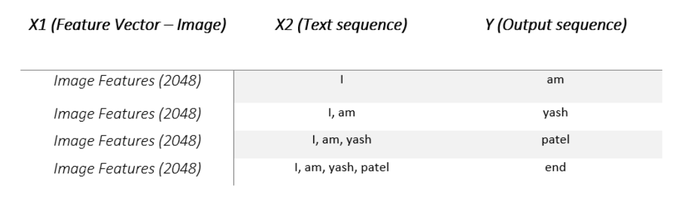

In [10]:
class CustomDataGenerator(Sequence):
    
    def __init__(self, df, X_col, y_col, batch_size, directory, tokenizer, 
                 vocab_size, max_length, features,shuffle=True):
    
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.directory = directory
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)
        
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __len__(self):
        return self.n // self.batch_size
    
    def __getitem__(self,index):
    
        batch = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size,:]
        X1, X2, y = self.__get_data(batch)        
        return (X1, X2), y
    
    def __get_data(self,batch):
        
        X1, X2, y = list(), list(), list()
        
        images = batch[self.X_col].tolist()
           
        for image in images:
            feature = self.features[image][0]
            
            captions = batch.loc[batch[self.X_col]==image, self.y_col].tolist()
            for caption in captions:
                seq = self.tokenizer.texts_to_sequences([caption])[0]

                for i in range(1,len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=self.vocab_size)[0]
                    X1.append(feature)
                    X2.append(in_seq)
                    y.append(out_seq)
            
        X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                
        return X1, X2, y

# Decoder

In [12]:
from tensorflow.keras.utils import plot_model

In [14]:
def getModel(model, shape_feature):
  #VGG16 -> shape(4096,)
  #DenseNet201 -> shape(1920,)
  #encoder model
  #image feature layers
  inputs1=Input(shape=(shape_feature,))
  fe1=Dropout(0.4)(inputs1)
  fe2=Dense(256,activation='relu')(fe1)
  #sequence feature layer
  inputs2=Input(shape=(max_length,))
  se1=Embedding(vocab_size,256,mask_zero=True)(inputs2)
  se2=Dropout(0.4)(se1)
  se3=model(se2)
  #decoder model
  decoder1=add([fe2,se3])
  decoder2=Dense(256,activation='relu')(decoder1)
  outputs=Dense(vocab_size,activation='softmax')(decoder2)

  model=Model(inputs=[inputs1,inputs2],outputs=outputs)
  model.compile(loss='categorical_crossentropy',optimizer='adam')


  #plot the model
  # plot_model(model,show_shapes=True)
  return model

## LSTM

In [15]:
DenseNet_LSTM = getModel(LSTM(256), 1920)
VGG16_LSTM = getModel(LSTM(256), 4096)

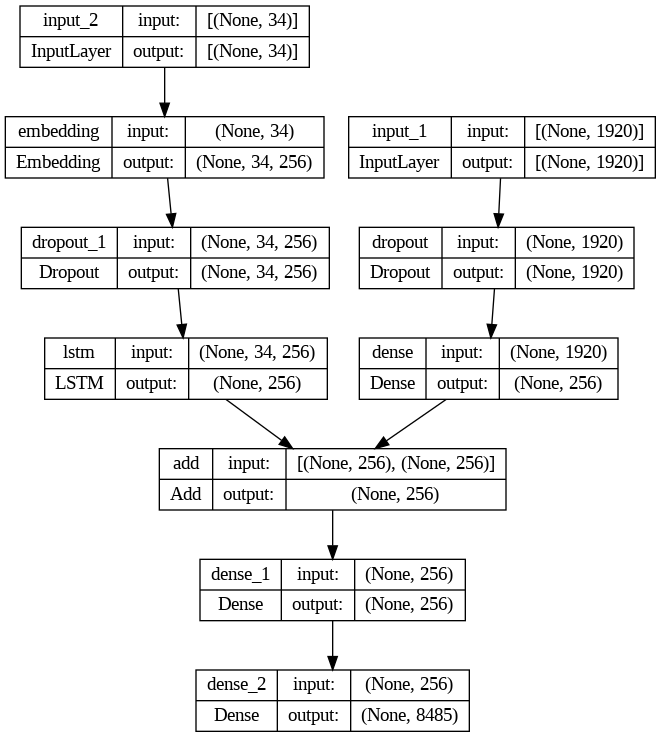

In [16]:
plot_model(DenseNet_LSTM,show_shapes=True)

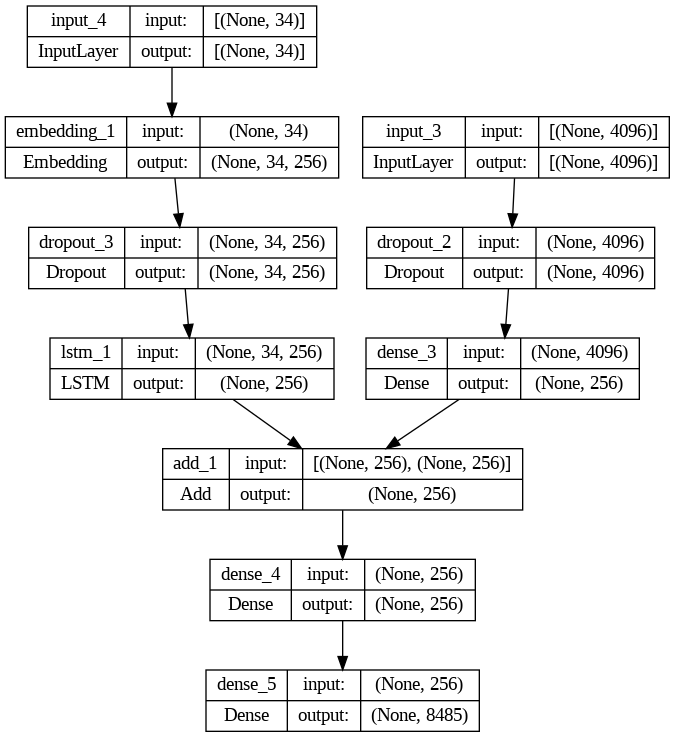

In [17]:
plot_model(VGG16_LSTM,show_shapes=True)

In [ ]:
DenseNet_LSTM.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 1920)]       0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 34, 256)      2172160     ['input_4[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 1920)         0           ['input_3[0][0]']                
                                                                                            

In [ ]:
VGG16_LSTM.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 4096)]       0           []                               
                                                                                                  
 embedding_2 (Embedding)        (None, 34, 256)      2172160     ['input_6[0][0]']                
                                                                                                  
 dropout_4 (Dropout)            (None, 4096)         0           ['input_5[0][0]']                
                                                                                            

## RNN

In [19]:
DenseNet_RNN = getModel(SimpleRNN(256), 1920)
VGG16_RNN = getModel(SimpleRNN(256), 4096)

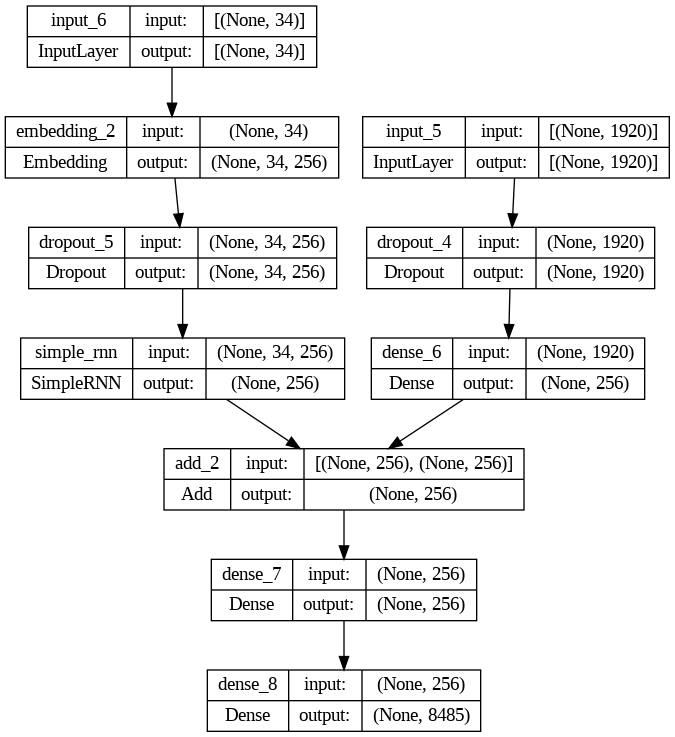

In [20]:
plot_model(DenseNet_RNN,show_shapes=True)

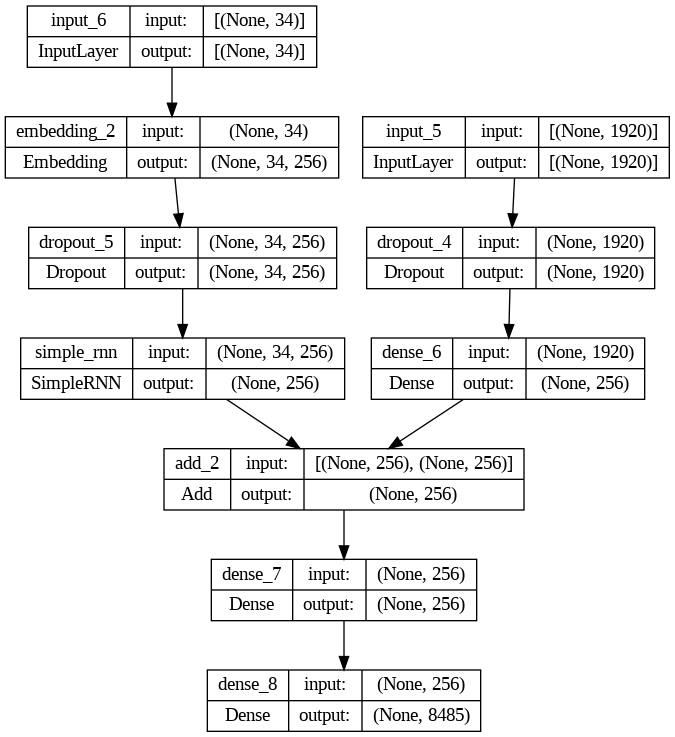

In [21]:
plot_model(DenseNet_RNN,show_shapes=True)

In [ ]:
DenseNet_RNN.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 34)]         0           []                               
                                                                                                  
 input_13 (InputLayer)          [(None, 1920)]       0           []                               
                                                                                                  
 embedding_6 (Embedding)        (None, 34, 256)      2172160     ['input_14[0][0]']               
                                                                                                  
 dropout_12 (Dropout)           (None, 1920)         0           ['input_13[0][0]']               
                                                                                            

In [ ]:
VGG16_RNN.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 34)]         0           []                               
                                                                                                  
 input_15 (InputLayer)          [(None, 4096)]       0           []                               
                                                                                                  
 embedding_7 (Embedding)        (None, 34, 256)      2172160     ['input_16[0][0]']               
                                                                                                  
 dropout_14 (Dropout)           (None, 4096)         0           ['input_15[0][0]']               
                                                                                            

## Get data & train

### Features extraction by VGG16

In [11]:
train_generator_VGG16 = CustomDataGenerator(df=train,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=featuresVGG16)

validation_generator_VGG16 = CustomDataGenerator(df=validation,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=featuresVGG16)

### Features extraction by DenseNet201

In [12]:
train_generator_DenseNet = CustomDataGenerator(df=train,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=featuresDenseNet)

validation_generator_DenseNet = CustomDataGenerator(df=validation,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=featuresDenseNet)

In [13]:
def getCheckPoint(model_name):
	return ModelCheckpoint(BASE_DIR+'/'+model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)

### LSTM (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_LSTM = DenseNet_LSTM.fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_LSTM.h5')])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.8503
Epoch 1: val_loss improved from inf to 4.05610, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM.h5
505/505 [==============================] - 273s 529ms/step - loss: 4.8503 - val_loss: 4.0561
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.7161
Epoch 2: val_loss improved from 4.05610 to 3.69164, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM.h5
505/505 [==============================] - 118s 233ms/step - loss: 3.7161 - val_loss: 3.6916
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.3379
Epoch 3: val_loss improved from 3.69164 to 3.61095, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM.h5
505/505 [==============================] - 129s 254ms/step - loss: 3.3379 - val_loss: 3.6110
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.0957
Epoch 4: val_loss improved from

### RNN (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_RNN = DenseNet_RNN.fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_RNN.h5')])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.6293
Epoch 1: val_loss improved from inf to 3.92082, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN.h5
505/505 [==============================] - 87s 167ms/step - loss: 4.6293 - val_loss: 3.9208
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.6273
Epoch 2: val_loss improved from 3.92082 to 3.66929, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN.h5
505/505 [==============================] - 77s 152ms/step - loss: 3.6273 - val_loss: 3.6693
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2821
Epoch 3: val_loss improved from 3.66929 to 3.60568, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN.h5
505/505 [==============================] - 83s 165ms/step - loss: 3.2821 - val_loss: 3.6057
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.0507
Epoch 4: val_loss improved from 3.605

### LSTM (VGG16)

In [ ]:
epochs=5
history_VGG16_LSTM = VGG16_LSTM.fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_LSTM.h5')])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.8718
Epoch 1: val_loss improved from inf to 4.13095, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM.h5
505/505 [==============================] - 324s 639ms/step - loss: 4.8718 - val_loss: 4.1309
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.7274
Epoch 2: val_loss improved from 4.13095 to 3.81086, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM.h5
505/505 [==============================] - 114s 225ms/step - loss: 3.7274 - val_loss: 3.8109
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.3075
Epoch 3: val_loss improved from 3.81086 to 3.75340, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM.h5
505/505 [==============================] - 107s 212ms/step - loss: 3.3075 - val_loss: 3.7534
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.0366
Epoch 4: val_loss did not improve from 3

### RNN (VGG16)

In [ ]:
epochs=5
history_VGG16_RNN = VGG16_RNN.fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_RNN.h5')])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.5437
Epoch 1: val_loss improved from inf to 3.95273, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN.h5
505/505 [==============================] - 85s 167ms/step - loss: 4.5437 - val_loss: 3.9527
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5412
Epoch 2: val_loss improved from 3.95273 to 3.78131, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN.h5
505/505 [==============================] - 81s 159ms/step - loss: 3.5412 - val_loss: 3.7813
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.1814
Epoch 3: val_loss improved from 3.78131 to 3.77842, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN.h5
505/505 [==============================] - 78s 155ms/step - loss: 3.1814 - val_loss: 3.7784
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 2.9372
Epoch 4: val_loss did not improve from 3.77842

## Load Models (saved)

In [14]:
DenseNet_LSTM = load_model(BASE_DIR+'/'+'DenseNet_LSTM.h5')
DenseNet_RNN = load_model(BASE_DIR+'/'+'DenseNet_RNN.h5')
VGG16_LSTM = load_model(BASE_DIR+'/'+'VGG16_LSTM.h5')
VGG16_RNN = load_model(BASE_DIR+'/'+'VGG16_RNN.h5')

# Evaluate

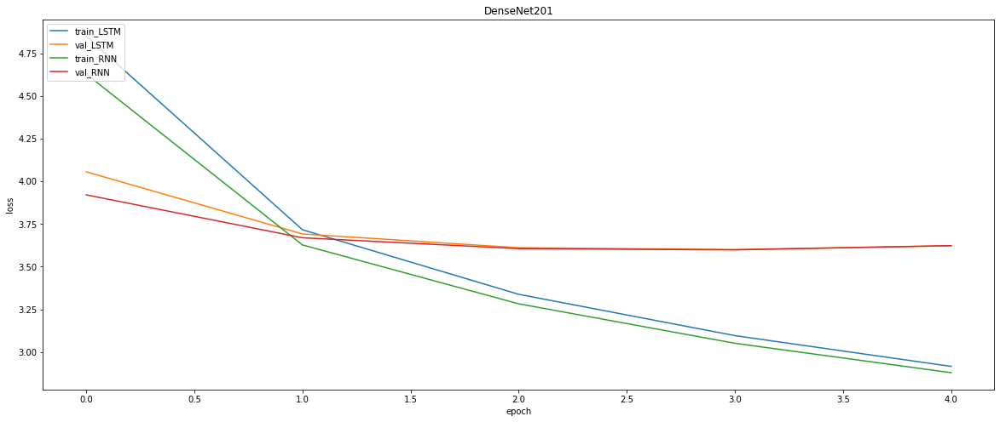

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(history_DenseNet_LSTM.history['loss'])
plt.plot(history_DenseNet_LSTM.history['val_loss'])
plt.plot(history_DenseNet_RNN.history['loss'])
plt.plot(history_DenseNet_RNN.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_LSTM', 'val_LSTM', 'train_RNN', 'val_RNN'], loc='upper left')
plt.title('DenseNet201')
plt.show()

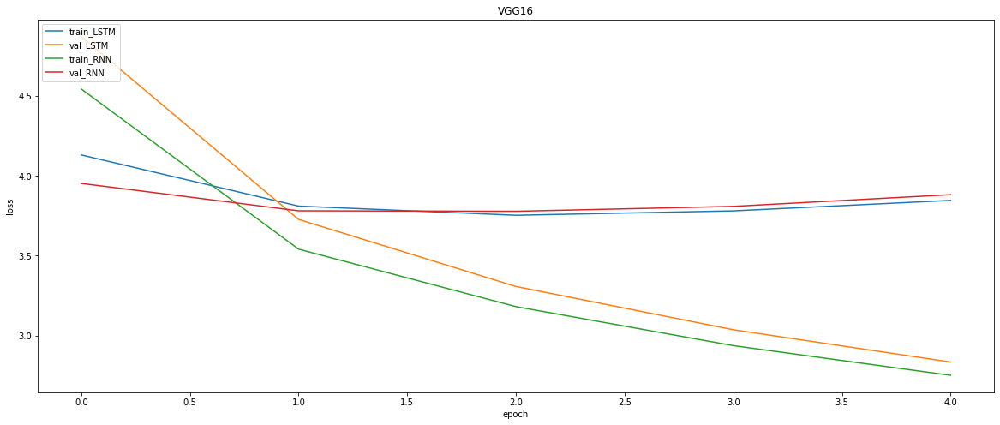

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(history_VGG16_LSTM.history['val_loss'])
plt.plot(history_VGG16_LSTM.history['loss'])
plt.plot(history_VGG16_RNN.history['loss'])
plt.plot(history_VGG16_RNN.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_LSTM', 'val_LSTM', 'train_RNN', 'val_RNN'], loc='upper left')
plt.title('VGG16')
plt.show()

In [15]:
def idx_to_word(integer,tokenizer):
    
    for word, index in tokenizer.word_index.items():
        if index==integer:
            return word
    return None

In [16]:
def predict_caption(model, image, tokenizer, max_length, features):
    
    feature = features[image]
    in_text = "startseq"
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)

        y_pred = model.predict([feature,sequence], verbose=0)
        y_pred = np.argmax(y_pred)
        
        word = idx_to_word(y_pred, tokenizer)
        
        if word is None:
            break
            
        in_text+= " " + word
        
        if word == 'endseq':
            break
            
    return in_text 

In [17]:
from nltk.translate.bleu_score import sentence_bleu
size_eval = 1000 # 1000/5 = 200 image (1 image -> 5 captions)
def evaluate(model, features, num = 5):
    pred_good, pred_bad, bleus = [], [], []
    count = 0
    check_img_good, check_img_bad = set(), set()
    for image, caption in tqdm(zip(test['image'][-size_eval:], test['caption'][-size_eval:])):
        count += 1
        caption_true = [idx_to_word(i, tokenizer) for i in tokenizer.texts_to_sequences([caption])[0]][1:-1]
        cap_pred = predict_caption(model, image, tokenizer, max_length, features)
        cap_pred = cap_pred.split(' ')[1:-1]
        bleu = sentence_bleu([caption_true],cap_pred)
        bleus.append(bleu)
        if bleu > 0.6 and len(pred_good) < num and image not in check_img_good:
          check_img_good.add(image)
          pred_good.append((bleu,image,caption_true,cap_pred))
        elif bleu < 0.3 and len(pred_bad) < num and image not in check_img_bad:
          check_img_bad.add(image)
          pred_bad.append((bleu,image,caption_true,cap_pred))
    return pred_good, pred_bad, bleus

## Evaluate Feature extraction by VGG16

### LSTM

In [ ]:
pred_good_VGG16_LSTM, pred_bad_VGG16_LSTM, bleus_VGG16_LSTM = evaluate(VGG16_LSTM, featuresVGG16)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [ ]:
d = dict()
d['pred_good'] = pred_good_VGG16_LSTM
d['pred_bad'] = pred_bad_VGG16_LSTM
d['bleu'] = bleus_VGG16_LSTM
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM.pkl', 'wb') as f:
    pickle.dump(d, f)

In [18]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM.pkl', 'rb') as f:
    d_VGG16_LSTM = pickle.load(f)
pred_good_VGG16_LSTM, pred_bad_VGG16_LSTM, bleus_VGG16_LSTM = d_VGG16_LSTM['pred_good'], d_VGG16_LSTM['pred_bad'], d_VGG16_LSTM['bleu']

### RNN

In [ ]:
pred_good_VGG16_RNN, pred_bad_VGG16_RNN, bleus_VGG16_RNN = evaluate(VGG16_RNN, featuresVGG16)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [ ]:
d = dict()
d['pred_good'] = pred_good_VGG16_RNN
d['pred_bad'] = pred_bad_VGG16_RNN
d['bleu'] = bleus_VGG16_RNN
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN.pkl', 'wb') as f:
    pickle.dump(d, f)

In [19]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN.pkl', 'rb') as f:
    d_VGG16_RNN = pickle.load(f)
pred_good_VGG16_RNN, pred_bad_VGG16_RNN, bleus_VGG16_RNN = d_VGG16_RNN['pred_good'], d_VGG16_RNN['pred_bad'], d_VGG16_RNN['bleu']

## Evaluate Features extract by DenseNet201

### LSTM

In [ ]:
pred_good_DenseNet_LSTM, pred_bad_DenseNet_LSTM, bleus_DenseNet_LSTM= evaluate(DenseNet_LSTM, featuresDenseNet)

0it [00:00, ?it/s]

In [ ]:
d = dict()
d['pred_good'] = pred_good_DenseNet_LSTM
d['pred_bad'] = pred_bad_DenseNet_LSTM
d['bleu'] = bleus_DenseNet_LSTM
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM.pkl', 'wb') as f:
    pickle.dump(d, f)

In [20]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM.pkl', 'rb') as f:
    d_DenseNet_LSTM = pickle.load(f)
pred_good_DenseNet_LSTM, pred_bad_DenseNet_LSTM, bleus_DenseNet_LSTM = d_DenseNet_LSTM['pred_good'], d_DenseNet_LSTM['pred_bad'], d_DenseNet_LSTM['bleu']

### RNN

In [29]:
pred_good_DenseNet_RNN, pred_bad_DenseNet_RNN, bleus_DenseNet_RNN= evaluate(DenseNet_RNN, featuresDenseNet)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [30]:
d = dict()
d['pred_good'] = pred_good_DenseNet_RNN
d['pred_bad'] = pred_bad_DenseNet_RNN
d['bleu'] = bleus_DenseNet_RNN
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN.pkl', 'wb') as f:
    pickle.dump(d, f)

In [21]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN.pkl', 'rb') as f:
    d_DenseNet_RNN = pickle.load(f)
pred_good_DenseNet_RNN, pred_bad_DenseNet_RNN, bleus_DenseNet_RNN = d_DenseNet_RNN['pred_good'], d_DenseNet_RNN['pred_bad'], d_DenseNet_RNN['bleu']

In [22]:
def plot_images(pred):
    def create_str(caption):
        strue = ""
        for s in caption:
            strue += " " + s
        return(strue)
    img_size = 224
    target_size = (img_size,img_size,3)
    count = 1
    fig = plt.figure(figsize=(10, 20))
    n = len(pred)
    for p in pred:
        bleu,image,caption_true,cap_pred=p
        filename = load_img(image_path+image, target_size=target_size)
        ax = fig.add_subplot(n,2,count,xticks=[],yticks=[])
        ax.imshow(filename)
        count+=1
        caption_true = create_str(caption_true)
        cap_pred = create_str(cap_pred)
        ax=fig.add_subplot(n,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        ax.text(0,0.7,"true:" + caption_true,fontsize=20)
        ax.text(0,0.4,"pred:" + cap_pred,fontsize=20)
        ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=20)
        count += 1
    plt.show()


Bad Caption VGG16-LSTM


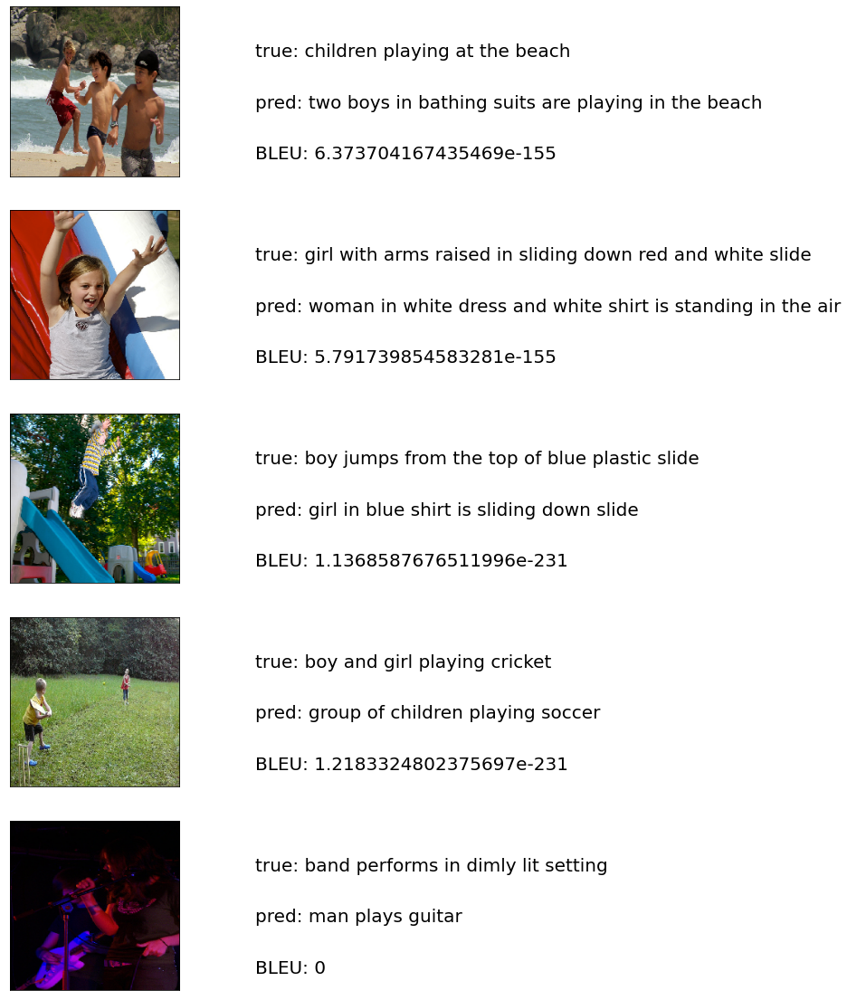

Good Caption VGG16-LSTM


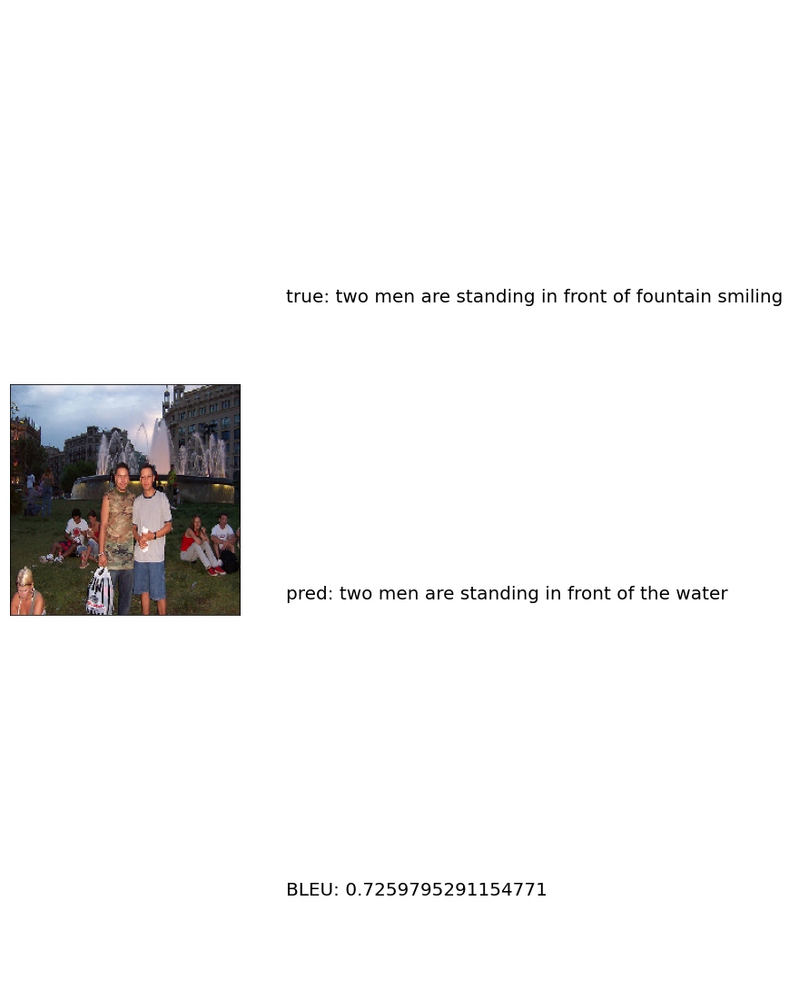

In [44]:
print("Bad Caption VGG16-LSTM")
plot_images(pred_bad_VGG16_LSTM)
print("Good Caption VGG16-LSTM")
plot_images(pred_good_VGG16_LSTM)

Bad Caption VGG16-RNN


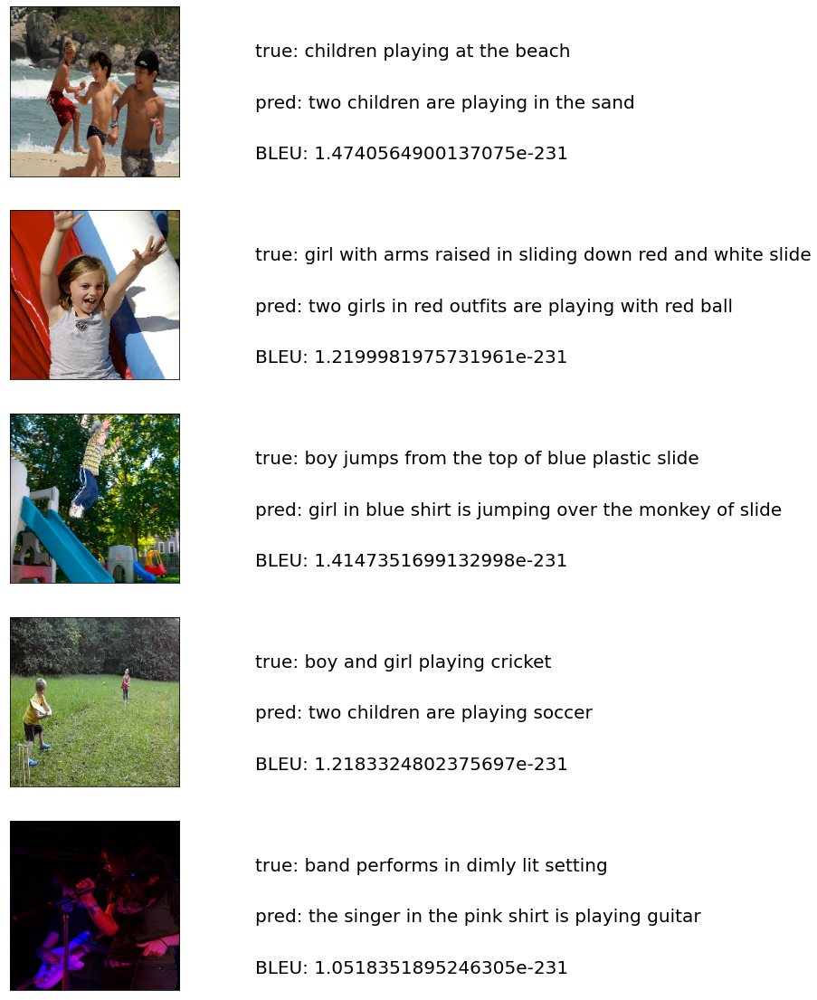

Good Caption VGG16-RNN


<Figure size 720x1440 with 0 Axes>

In [42]:
print("Bad Caption VGG16-RNN")
plot_images(pred_bad_VGG16_RNN)
print("Good Caption VGG16-RNN")
plot_images(pred_good_VGG16_RNN)

Bad Caption DenseNet-LSTM


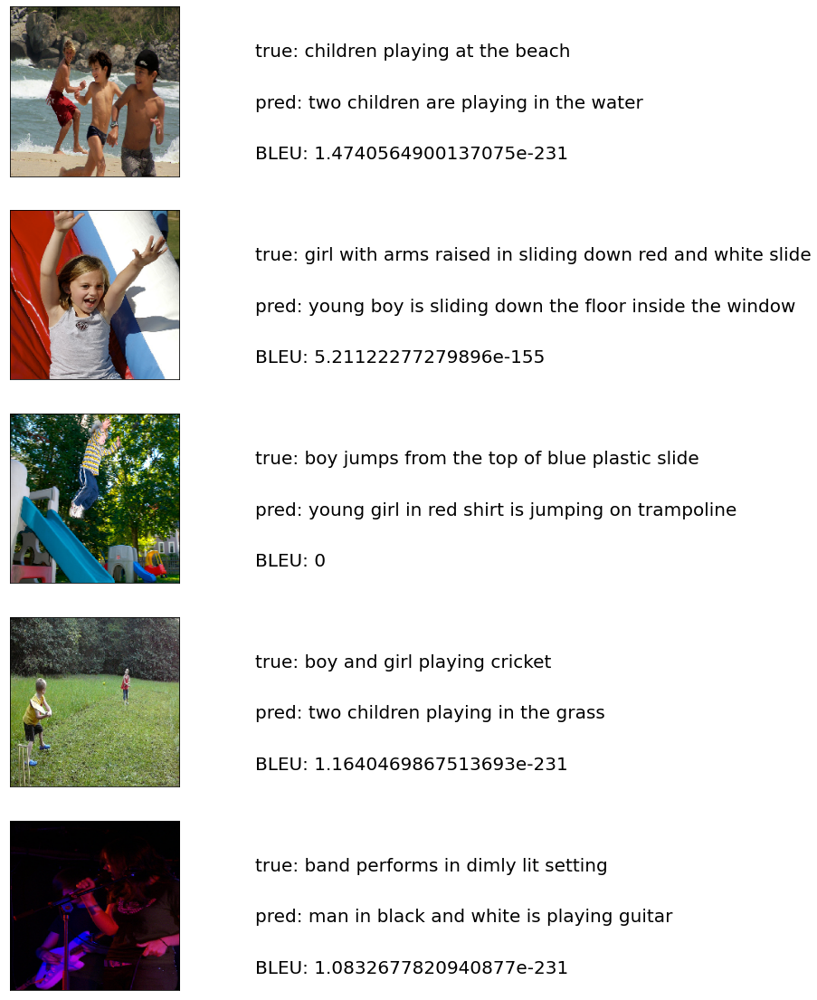

Good Caption DenseNet-LSTM


<Figure size 720x1440 with 0 Axes>

In [45]:
print("Bad Caption DenseNet-LSTM")
plot_images(pred_bad_DenseNet_LSTM)
print("Good Caption DenseNet-LSTM")
plot_images(pred_good_DenseNet_LSTM)

Bad Caption DenseNet-RNN


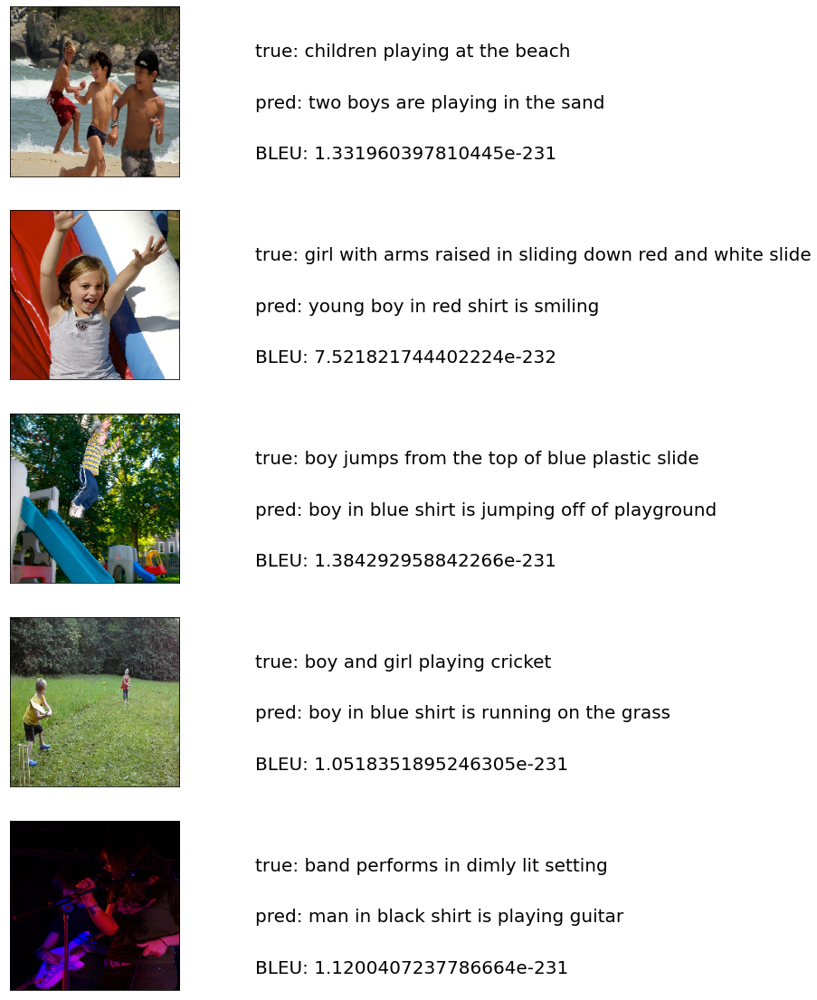

Good Caption DenseNet-RNN


<Figure size 720x1440 with 0 Axes>

In [36]:
print("Bad Caption DenseNet-RNN")
plot_images(pred_bad_DenseNet_RNN)
print("Good Caption DenseNet-RNN")
plot_images(pred_good_DenseNet_RNN)

## BLEU score

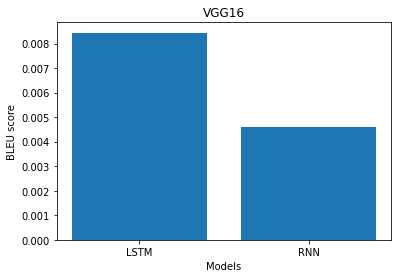

In [46]:
plt.bar(['LSTM', 'RNN'], [np.mean(bleus_VGG16_LSTM), np.mean(bleus_VGG16_RNN)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("VGG16")
plt.show()

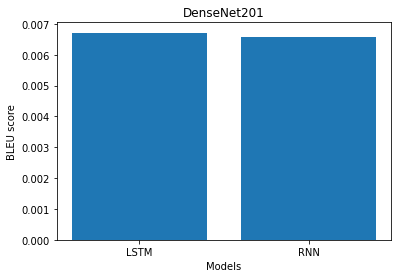

In [47]:
plt.bar(['LSTM', 'RNN'], [np.mean(bleus_DenseNet_LSTM), np.mean(bleus_DenseNet_RNN)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("DenseNet201")
plt.show()

## **Taking 15 Random Samples for Caption Prediction**

In [48]:
samples = test.sample(15)
samples.reset_index(drop=True,inplace=True)

In [ ]:
def random_caption_pred(model, samples, features):
  for index,record in samples.iterrows():

    img = load_img(os.path.join(image_path,record['image']),target_size=(224,224))
    img = img_to_array(img)
    img = img/255.
    
    caption = predict_caption(model, record['image'], tokenizer, max_length, features)
    samples.loc[index,'caption'] = caption

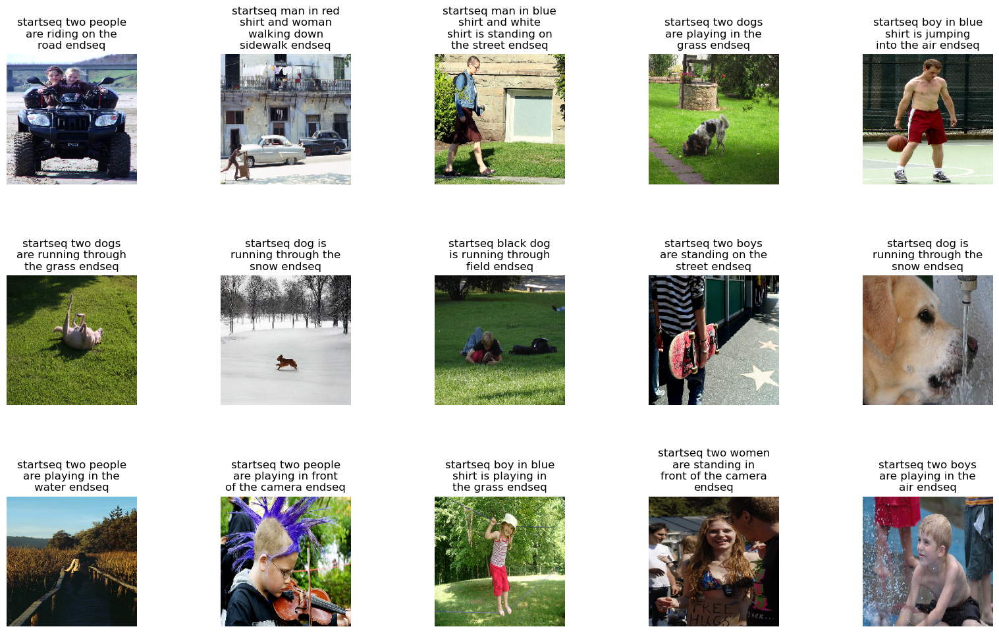

In [ ]:
display_images(VGG16_LSTM, samples, featuresVGG16)

# Handling Overfiting

## Early stopping + validation

In [ ]:
earlystopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 5, verbose = 1, restore_best_weights=True)

### LSTM (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_LSTM_Overfit = getModel(LSTM(256), 1920).fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_LSTM_Overfit.h5'), earlystopping])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.8466
Epoch 1: val_loss improved from inf to 4.06515, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Overfit.h5
505/505 [==============================] - 267s 514ms/step - loss: 4.8466 - val_loss: 4.0652
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.7270
Epoch 2: val_loss improved from 4.06515 to 3.71062, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Overfit.h5
505/505 [==============================] - 116s 228ms/step - loss: 3.7270 - val_loss: 3.7106
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.3442
Epoch 3: val_loss improved from 3.71062 to 3.59548, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Overfit.h5
505/505 [==============================] - 106s 209ms/step - loss: 3.3442 - val_loss: 3.5955
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.1090
Epoch 4

### RNN (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_RNN_Overfit = getModel(SimpleRNN(256), 1920).fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_RNN_Overfit.h5'), earlystopping])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.6262
Epoch 1: val_loss improved from inf to 3.91839, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Overfit.h5
505/505 [==============================] - 88s 169ms/step - loss: 4.6262 - val_loss: 3.9184
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.6124
Epoch 2: val_loss improved from 3.91839 to 3.67235, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Overfit.h5
505/505 [==============================] - 81s 160ms/step - loss: 3.6124 - val_loss: 3.6724
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2736
Epoch 3: val_loss improved from 3.67235 to 3.58755, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Overfit.h5
505/505 [==============================] - 79s 156ms/step - loss: 3.2736 - val_loss: 3.5876
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.0539
Epoch 4: val_

### LSTM (VGG16)

In [ ]:
epochs=5
history_VGG16_LSTM_Overfit = getModel(LSTM(256), 4096).fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_LSTM_Overfit.h5'), earlystopping])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.8621
Epoch 1: val_loss improved from inf to 4.11146, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Overfit.h5
505/505 [==============================] - 292s 567ms/step - loss: 4.8621 - val_loss: 4.1115
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.6988
Epoch 2: val_loss improved from 4.11146 to 3.80287, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Overfit.h5
505/505 [==============================] - 113s 224ms/step - loss: 3.6988 - val_loss: 3.8029
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2778
Epoch 3: val_loss improved from 3.80287 to 3.75446, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Overfit.h5
505/505 [==============================] - 107s 212ms/step - loss: 3.2778 - val_loss: 3.7545
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 3.0058
Epoch 4: val_los

### RNN (VGG16)

In [ ]:
epochs=5
history_VGG16_RNN_Overfit = getModel(SimpleRNN(256), 4096).fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_RNN_Overfit.h5'), earlystopping])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.5639
Epoch 1: val_loss improved from inf to 3.95599, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Overfit.h5
505/505 [==============================] - 90s 174ms/step - loss: 4.5639 - val_loss: 3.9560
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5497
Epoch 2: val_loss improved from 3.95599 to 3.78747, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Overfit.h5
505/505 [==============================] - 84s 167ms/step - loss: 3.5497 - val_loss: 3.7875
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.1793
Epoch 3: val_loss improved from 3.78747 to 3.73014, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Overfit.h5
505/505 [==============================] - 81s 160ms/step - loss: 3.1793 - val_loss: 3.7301
Epoch 4/5
505/505 [==============================] - ETA: 0s - loss: 2.9311
Epoch 4: val_loss did 

## Load Model (saved)

In [23]:
DenseNet_LSTM_Overfit = load_model(BASE_DIR+'/'+'DenseNet_LSTM_Overfit.h5')
DenseNet_RNN_Overfit = load_model(BASE_DIR+'/'+'DenseNet_RNN_Overfit.h5')
VGG16_LSTM_Overfit = load_model(BASE_DIR+'/'+'VGG16_LSTM_Overfit.h5')
VGG16_RNN_Overfit = load_model(BASE_DIR+'/'+'VGG16_RNN_Overfit.h5')

### Evaluate Feature extraction by VGG16

#### LSTM

In [50]:
pred_good_VGG16_LSTM_Overfit, pred_bad_VGG16_LSTM_Overfit, bleus_VGG16_LSTM_Overfit = evaluate(VGG16_LSTM_Overfit, featuresVGG16)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [51]:
d = dict()
d['pred_good'] = pred_good_VGG16_LSTM_Overfit
d['pred_bad'] = pred_bad_VGG16_LSTM_Overfit
d['bleu'] = bleus_VGG16_LSTM_Overfit
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM_Overfit.pkl', 'wb') as f:
    pickle.dump(d, f)

In [24]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM_Overfit.pkl', 'rb') as f:
    d_VGG16_LSTM_Overfit = pickle.load(f)
pred_good_VGG16_LSTM_Overfit, pred_bad_VGG16_LSTM_Overfit, bleus_VGG16_LSTM_Overfit = d_VGG16_LSTM_Overfit['pred_good'], d_VGG16_LSTM_Overfit['pred_bad'], d_VGG16_LSTM_Overfit['bleu']

#### RNN

In [53]:
pred_good_VGG16_RNN_Overfit, pred_bad_VGG16_RNN_Overfit, bleus_VGG16_RNN_Overfit = evaluate(VGG16_RNN_Overfit, featuresVGG16)

0it [00:00, ?it/s]

In [54]:
d = dict()
d['pred_good'] = pred_good_VGG16_RNN_Overfit
d['pred_bad'] = pred_bad_VGG16_RNN_Overfit
d['bleu'] = bleus_VGG16_RNN_Overfit
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN_Overfit.pkl', 'wb') as f:
    pickle.dump(d, f)

In [25]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN_Overfit.pkl', 'rb') as f:
    d_VGG16_RNN_Overfit = pickle.load(f)
pred_good_VGG16_RNN_Overfit, pred_bad_VGG16_RNN_Overfit, bleus_VGG16_RNN_Overfit = d_VGG16_RNN_Overfit['pred_good'], d_VGG16_RNN_Overfit['pred_bad'], d_VGG16_RNN_Overfit['bleu']

### Evaluate Features extract by DenseNet201

#### LSTM

In [25]:
pred_good_DenseNet_LSTM_Overfit, pred_bad_DenseNet_LSTM_Overfit, bleus_DenseNet_LSTM_Overfit= evaluate(DenseNet_LSTM_Overfit, featuresDenseNet)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [26]:
d = dict()
d['pred_good'] = pred_good_DenseNet_LSTM_Overfit
d['pred_bad'] = pred_bad_DenseNet_LSTM_Overfit
d['bleu'] = bleus_DenseNet_LSTM_Overfit
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM_Overfit.pkl', 'wb') as f:
    pickle.dump(d, f)

In [26]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM_Overfit.pkl', 'rb') as f:
    d_DenseNet_LSTM_Overfit = pickle.load(f)
pred_good_DenseNet_LSTM_Overfit, pred_bad_DenseNet_LSTM_Overfit, bleus_DenseNet_LSTM_Overfit = d_DenseNet_LSTM_Overfit['pred_good'], d_DenseNet_LSTM_Overfit['pred_bad'], d_DenseNet_LSTM_Overfit['bleu']

#### RNN

In [28]:
pred_good_DenseNet_RNN_Overfit, pred_bad_DenseNet_RNN_Overfit, bleus_DenseNet_RNN_Overfit= evaluate(DenseNet_RNN_Overfit, featuresDenseNet)

0it [00:00, ?it/s]

In [29]:
d = dict()
d['pred_good'] = pred_good_DenseNet_RNN_Overfit
d['pred_bad'] = pred_bad_DenseNet_RNN_Overfit
d['bleu'] = bleus_DenseNet_RNN_Overfit
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN_Overfit.pkl', 'wb') as f:
    pickle.dump(d, f)

In [27]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN_Overfit.pkl', 'rb') as f:
    d_DenseNet_RNN_Overfit = pickle.load(f)
pred_good_DenseNet_RNN_Overfit, pred_bad_DenseNet_RNN_Overfit, bleus_DenseNet_RNN_Overfit = d_DenseNet_RNN_Overfit['pred_good'], d_DenseNet_RNN_Overfit['pred_bad'], d_DenseNet_RNN_Overfit['bleu']

Bad Caption VGG16-LSTM_Overfit


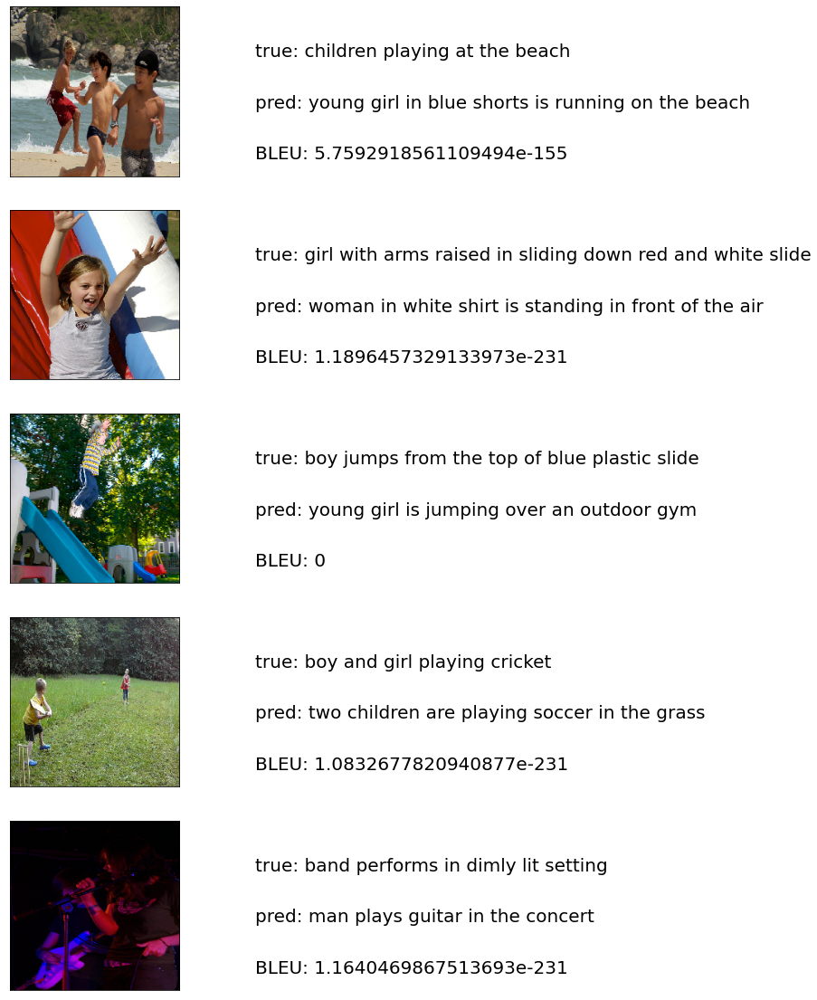

Good Caption VGG16-LSTM_Overfit


<Figure size 720x1440 with 0 Axes>

In [31]:
print("Bad Caption VGG16-LSTM_Overfit")
plot_images(pred_bad_VGG16_LSTM_Overfit)
print("Good Caption VGG16-LSTM_Overfit")
plot_images(pred_good_VGG16_LSTM_Overfit)

Bad Caption VGG16-RNN_Overfit


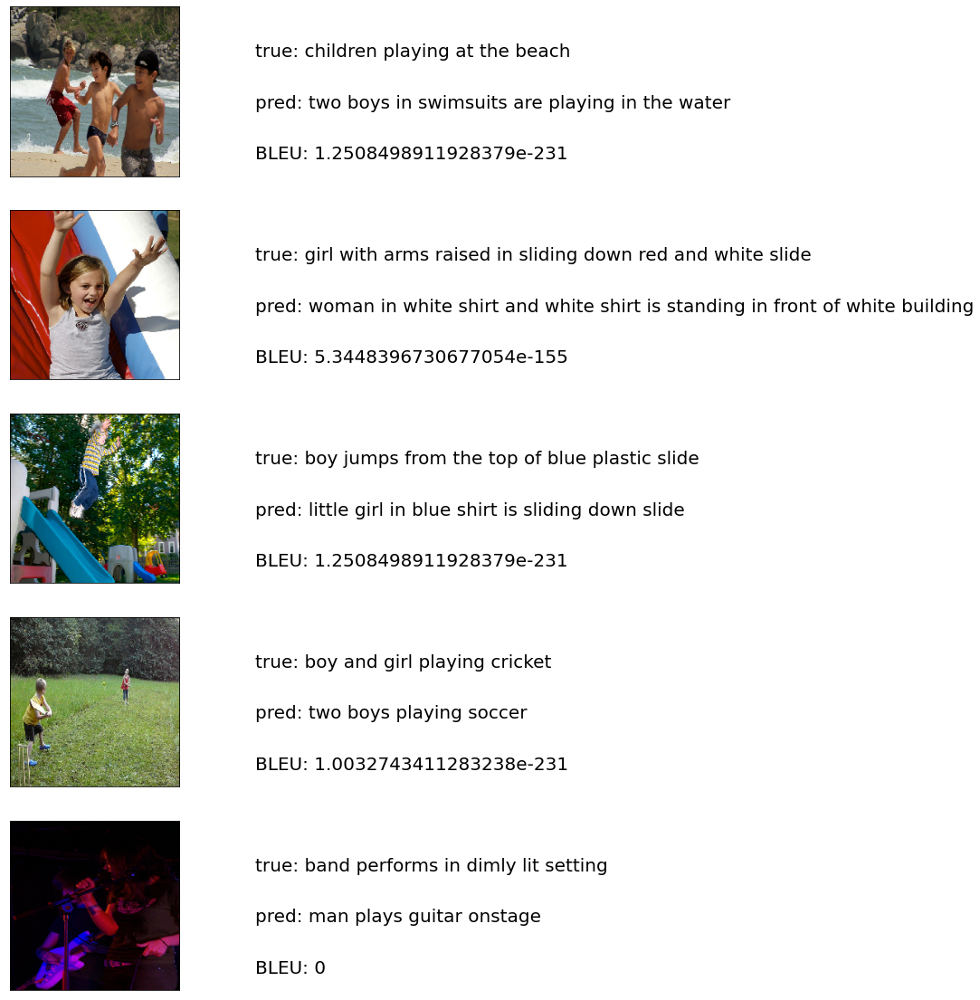

Good Caption VGG16-RNN_Overfit


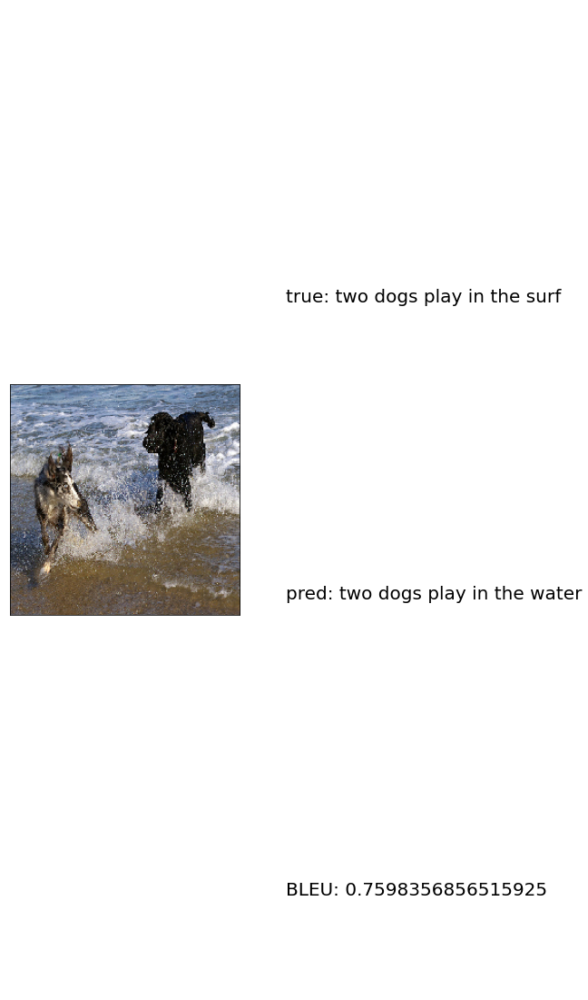

In [32]:
print("Bad Caption VGG16-RNN_Overfit")
plot_images(pred_bad_VGG16_RNN_Overfit)
print("Good Caption VGG16-RNN_Overfit")
plot_images(pred_good_VGG16_RNN_Overfit)

Bad Caption DenseNet-LSTM_Overfit


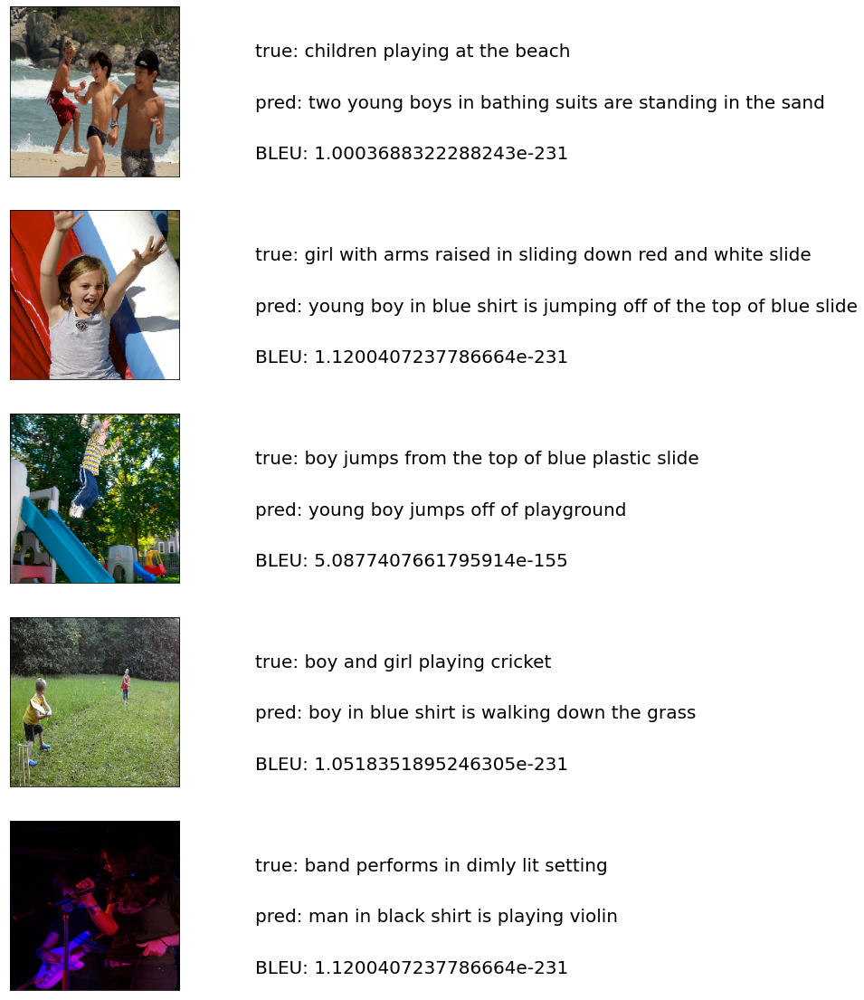

Good Caption DenseNet-LSTM_Overfit


<Figure size 720x1440 with 0 Axes>

In [33]:
print("Bad Caption DenseNet-LSTM_Overfit")
plot_images(pred_bad_DenseNet_LSTM_Overfit)
print("Good Caption DenseNet-LSTM_Overfit")
plot_images(pred_good_DenseNet_LSTM_Overfit)

Bad Caption DenseNet-RNN_Overfit


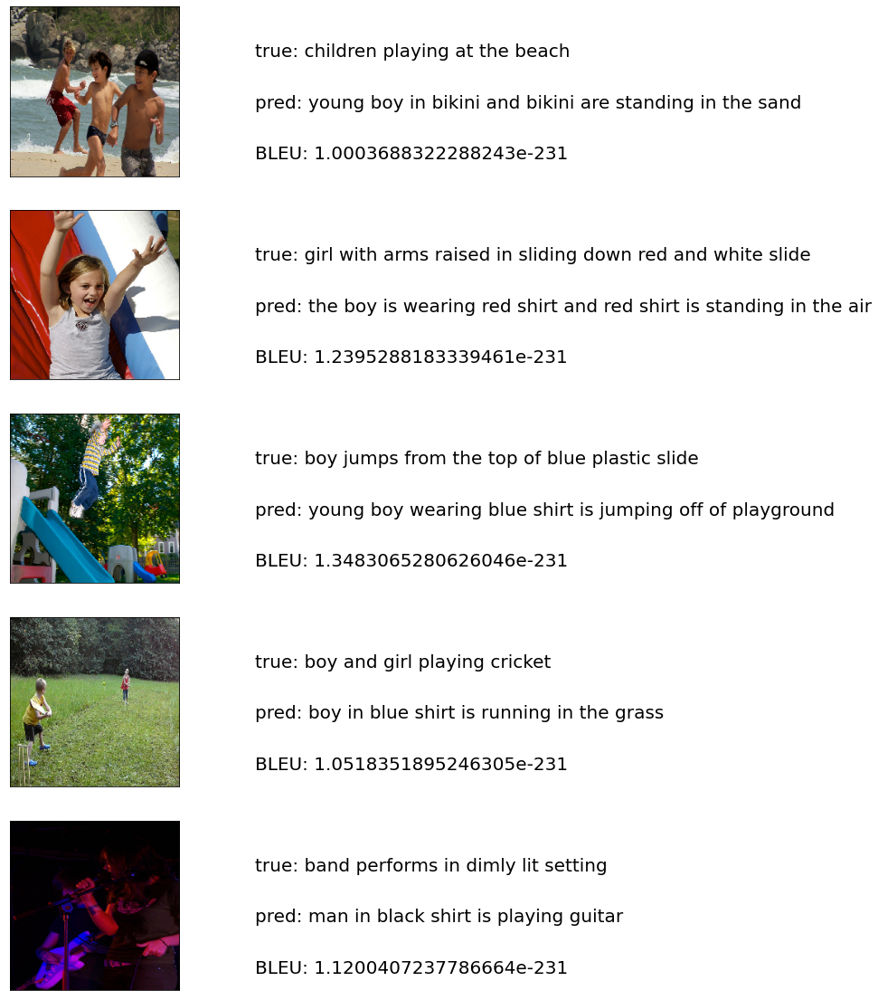

Good Caption DenseNet-RNN_Overfit


<Figure size 720x1440 with 0 Axes>

In [34]:
print("Bad Caption DenseNet-RNN_Overfit")
plot_images(pred_bad_DenseNet_RNN_Overfit)
print("Good Caption DenseNet-RNN_Overfit")
plot_images(pred_good_DenseNet_RNN_Overfit)

### BLEU score

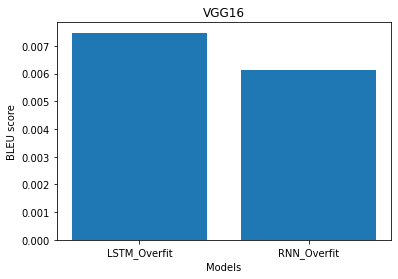

In [35]:
plt.bar(['LSTM_Overfit', 'RNN_Overfit'], [np.mean(bleus_VGG16_LSTM_Overfit), np.mean(bleus_VGG16_RNN_Overfit)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("VGG16")
plt.show()

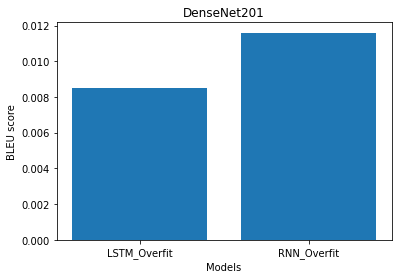

In [36]:
plt.bar(['LSTM_Overfit', 'RNN_Overfit'], [np.mean(bleus_DenseNet_LSTM_Overfit), np.mean(bleus_DenseNet_RNN_Overfit)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("DenseNet201")
plt.show()

# Handling Vanishing

## Proper Weight Initialization/ Batch Normalization/ Gradient Clipping/ learning rate reduction

In [ ]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.2, 
                                            min_lr=0.00000001)

In [ ]:
def getModel_vanishing(model, shape_feature):
  #VGG16 -> shape(4096,)
  #DenseNet201 -> shape(1920,)
  #encoder model
  #image feature layers
  inputs1=Input(shape=(shape_feature,))
  fe1=Dropout(0.4)(inputs1)
  fe2=Dense(256,activation='relu',kernel_initializer="he_normal")(fe1)
  #sequence feature layer
  inputs2=Input(shape=(max_length,))
  se1=Embedding(vocab_size,256,mask_zero=True)(inputs2)
  se2=Dropout(0.4)(se1)
  se3=model(se2)
  #decoder model
  decoder1=add([fe2,se3])
  decoder2=Dense(256,activation='relu', kernel_initializer="he_uniform")(decoder1)
  decoder3=BatchNormalization()(decoder2)
  outputs=Dense(vocab_size,activation='softmax')(decoder3)

  model=Model(inputs=[inputs1,inputs2],outputs=outputs)
  optimizer = Adam(clipnorm = 1.0)
  model.compile(loss='categorical_crossentropy',optimizer=optimizer)


  #plot the model
  plot_model(model,show_shapes=True)
  return model

### LSTM (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_LSTM_Vanishing = getModel_vanishing(LSTM(256), 1920).fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_LSTM_Vanishing.h5'), earlystopping, learning_rate_reduction])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.9753
Epoch 1: val_loss improved from inf to 3.86732, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Vanishing.h5
505/505 [==============================] - 120s 223ms/step - loss: 4.9753 - val_loss: 3.8673 - lr: 0.0010
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5635
Epoch 2: val_loss improved from 3.86732 to 3.59411, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Vanishing.h5
505/505 [==============================] - 108s 213ms/step - loss: 3.5635 - val_loss: 3.5941 - lr: 0.0010
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2309
Epoch 3: val_loss improved from 3.59411 to 3.51597, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_LSTM_Vanishing.h5
505/505 [==============================] - 110s 217ms/step - loss: 3.2309 - val_loss: 3.5160 - lr: 0.0010
Epoch 4/5
505/505 [===================

### RNN (DenseNet201)

In [ ]:
epochs=5
history_DenseNet_RNN_Vanishing = getModel_vanishing(SimpleRNN(256), 1920).fit(
        train_generator_DenseNet,
        epochs=epochs,
        validation_data=validation_generator_DenseNet,
        callbacks=[getCheckPoint('DenseNet_RNN_Vanishing.h5'), earlystopping, learning_rate_reduction])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.8338
Epoch 1: val_loss improved from inf to 3.81576, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Vanishing.h5
505/505 [==============================] - 88s 166ms/step - loss: 4.8338 - val_loss: 3.8158 - lr: 0.0010
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5385
Epoch 2: val_loss improved from 3.81576 to 3.57491, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Vanishing.h5
505/505 [==============================] - 80s 159ms/step - loss: 3.5385 - val_loss: 3.5749 - lr: 0.0010
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2204
Epoch 3: val_loss improved from 3.57491 to 3.49654, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/DenseNet_RNN_Vanishing.h5
505/505 [==============================] - 79s 157ms/step - loss: 3.2204 - val_loss: 3.4965 - lr: 0.0010
Epoch 4/5
505/505 [=========================

### LSTM (VGG16)

In [ ]:
epochs=5
history_VGG16_LSTM_Vanishing = getModel_vanishing(LSTM(256), 4096).fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_LSTM_Vanishing.h5'), earlystopping, learning_rate_reduction])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 5.1373
Epoch 1: val_loss improved from inf to 3.99267, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Vanishing.h5
505/505 [==============================] - 123s 231ms/step - loss: 5.1373 - val_loss: 3.9927 - lr: 0.0010
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5877
Epoch 2: val_loss improved from 3.99267 to 3.73282, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Vanishing.h5
505/505 [==============================] - 109s 216ms/step - loss: 3.5877 - val_loss: 3.7328 - lr: 0.0010
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2066
Epoch 3: val_loss improved from 3.73282 to 3.65776, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_LSTM_Vanishing.h5
505/505 [==============================] - 116s 229ms/step - loss: 3.2066 - val_loss: 3.6578 - lr: 0.0010
Epoch 4/5
505/505 [============================

### RNN (VGG16)

In [ ]:
epochs=5
history_VGG16_RNN_Vanishing = getModel_vanishing(SimpleRNN(256), 4096).fit(
        train_generator_VGG16,
        epochs=epochs,
        validation_data=validation_generator_VGG16,
        callbacks=[getCheckPoint('VGG16_RNN_Vanishing.h5'), earlystopping, learning_rate_reduction])

Epoch 1/5
505/505 [==============================] - ETA: 0s - loss: 4.9628
Epoch 1: val_loss improved from inf to 3.98278, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Vanishing.h5
505/505 [==============================] - 90s 172ms/step - loss: 4.9628 - val_loss: 3.9828 - lr: 0.0010
Epoch 2/5
505/505 [==============================] - ETA: 0s - loss: 3.5853
Epoch 2: val_loss improved from 3.98278 to 3.70721, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Vanishing.h5
505/505 [==============================] - 87s 171ms/step - loss: 3.5853 - val_loss: 3.7072 - lr: 0.0010
Epoch 3/5
505/505 [==============================] - ETA: 0s - loss: 3.2103
Epoch 3: val_loss improved from 3.70721 to 3.64281, saving model to /content/drive/MyDrive/Deep Learning/MidTerm/VGG16_RNN_Vanishing.h5
505/505 [==============================] - 82s 163ms/step - loss: 3.2103 - val_loss: 3.6428 - lr: 0.0010
Epoch 4/5
505/505 [==============================] - 

## Load Model (saved)

In [28]:
DenseNet_LSTM_Vanishing = load_model(BASE_DIR+'/'+'DenseNet_LSTM_Vanishing.h5')
DenseNet_RNN_Vanishing = load_model(BASE_DIR+'/'+'DenseNet_RNN_Vanishing.h5')
VGG16_LSTM_Vanishing = load_model(BASE_DIR+'/'+'VGG16_LSTM_Vanishing.h5')
VGG16_RNN_Vanishing = load_model(BASE_DIR+'/'+'VGG16_RNN_Vanishing.h5')

### Evaluate Feature extraction by VGG16

#### LSTM

In [38]:
pred_good_VGG16_LSTM_Vanishing, pred_bad_VGG16_LSTM_Vanishing, bleus_VGG16_LSTM_Vanishing = evaluate(VGG16_LSTM_Vanishing, featuresVGG16)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [39]:
d = dict()
d['pred_good'] = pred_good_VGG16_LSTM_Vanishing
d['pred_bad'] = pred_bad_VGG16_LSTM_Vanishing
d['bleu'] = bleus_VGG16_LSTM_Vanishing
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM_Vanishing.pkl', 'wb') as f:
    pickle.dump(d, f)

In [29]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_LSTM_Vanishing.pkl', 'rb') as f:
    d_VGG16_LSTM_Vanishing = pickle.load(f)
pred_good_VGG16_LSTM_Vanishing, pred_bad_VGG16_LSTM_Vanishing, bleus_VGG16_LSTM_Vanishing = d_VGG16_LSTM_Vanishing['pred_good'], d_VGG16_LSTM_Vanishing['pred_bad'], d_VGG16_LSTM_Vanishing['bleu']

#### RNN

In [30]:
pred_good_VGG16_RNN_Vanishing, pred_bad_VGG16_RNN_Vanishing, bleus_VGG16_RNN_Vanishing = evaluate(VGG16_RNN_Vanishing, featuresVGG16)

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

In [31]:
d = dict()
d['pred_good'] = pred_good_VGG16_RNN_Vanishing
d['pred_bad'] = pred_bad_VGG16_RNN_Vanishing
d['bleu'] = bleus_VGG16_RNN_Vanishing
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN_Vanishing.pkl', 'wb') as f:
    pickle.dump(d, f)

In [32]:
with open(BASE_DIR+'/'+'Evaluate_VGG16_RNN_Vanishing.pkl', 'rb') as f:
    d_VGG16_RNN_Vanishing = pickle.load(f)
pred_good_VGG16_RNN_Vanishing, pred_bad_VGG16_RNN_Vanishing, bleus_VGG16_RNN_Vanishing = d_VGG16_RNN_Vanishing['pred_good'], d_VGG16_RNN_Vanishing['pred_bad'], d_VGG16_RNN_Vanishing['bleu']

### Evaluate Features extract by DenseNet201

#### LSTM

In [33]:
pred_good_DenseNet_LSTM_Vanishing, pred_bad_DenseNet_LSTM_Vanishing, bleus_DenseNet_LSTM_Vanishing= evaluate(DenseNet_LSTM_Vanishing, featuresDenseNet)

0it [00:00, ?it/s]

In [34]:
d = dict()
d['pred_good'] = pred_good_DenseNet_LSTM_Vanishing
d['pred_bad'] = pred_bad_DenseNet_LSTM_Vanishing
d['bleu'] = bleus_DenseNet_LSTM_Vanishing
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM_Vanishing.pkl', 'wb') as f:
    pickle.dump(d, f)

In [35]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_LSTM_Vanishing.pkl', 'rb') as f:
    d_DenseNet_LSTM_Vanishing = pickle.load(f)
pred_good_DenseNet_LSTM_Vanishing, pred_bad_DenseNet_LSTM_Vanishing, bleus_DenseNet_LSTM_Vanishing = d_DenseNet_LSTM_Vanishing['pred_good'], d_DenseNet_LSTM_Vanishing['pred_bad'], d_DenseNet_LSTM_Vanishing['bleu']

#### RNN

In [36]:
pred_good_DenseNet_RNN_Vanishing, pred_bad_DenseNet_RNN_Vanishing, bleus_DenseNet_RNN_Vanishing= evaluate(DenseNet_RNN_Vanishing, featuresDenseNet)

0it [00:00, ?it/s]

In [37]:
d = dict()
d['pred_good'] = pred_good_DenseNet_RNN_Vanishing
d['pred_bad'] = pred_bad_DenseNet_RNN_Vanishing
d['bleu'] = bleus_DenseNet_RNN_Vanishing
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN_Vanishing.pkl', 'wb') as f:
    pickle.dump(d, f)

In [38]:
with open(BASE_DIR+'/'+'Evaluate_DenseNet_RNN_Vanishing.pkl', 'rb') as f:
    d_DenseNet_RNN_Vanishing = pickle.load(f)
pred_good_DenseNet_RNN_Vanishing, pred_bad_DenseNet_RNN_Vanishing, bleus_DenseNet_RNN_Vanishing = d_DenseNet_RNN_Vanishing['pred_good'], d_DenseNet_RNN_Vanishing['pred_bad'], d_DenseNet_RNN_Vanishing['bleu']

Bad Caption VGG16-LSTM_Vanishing


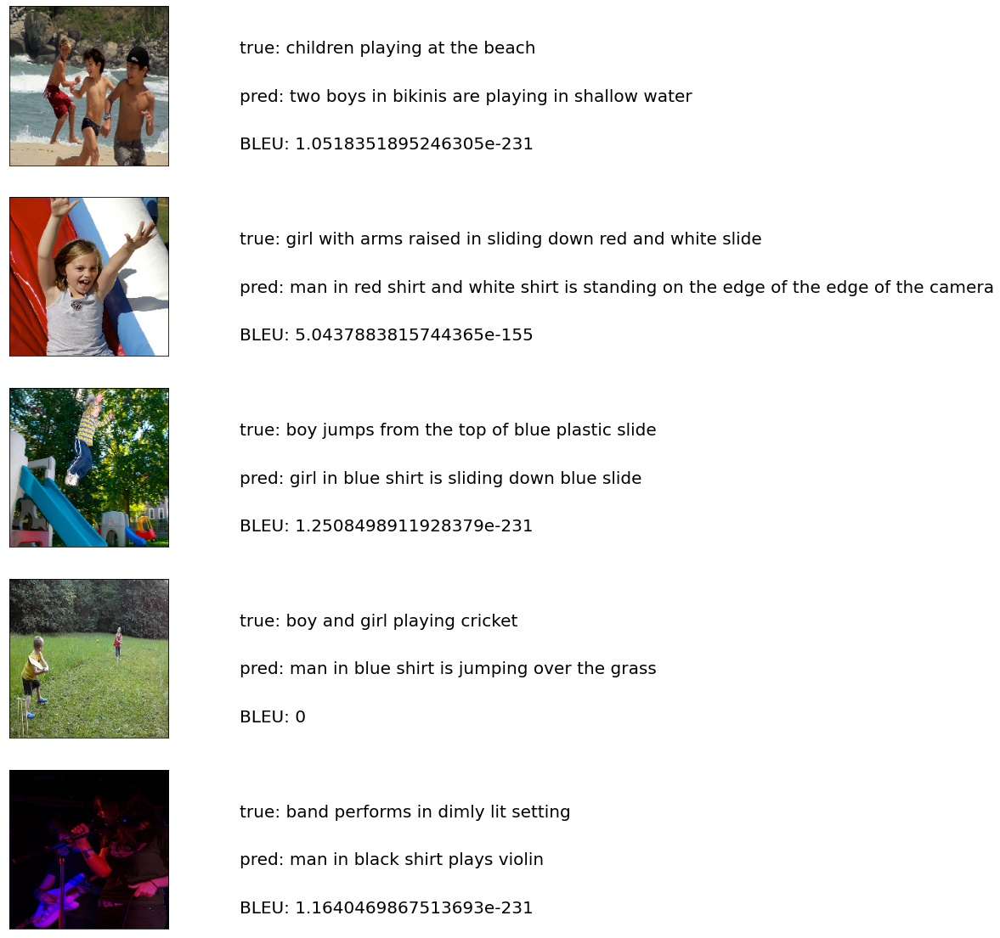

Good Caption VGG16-LSTM_Vanishing


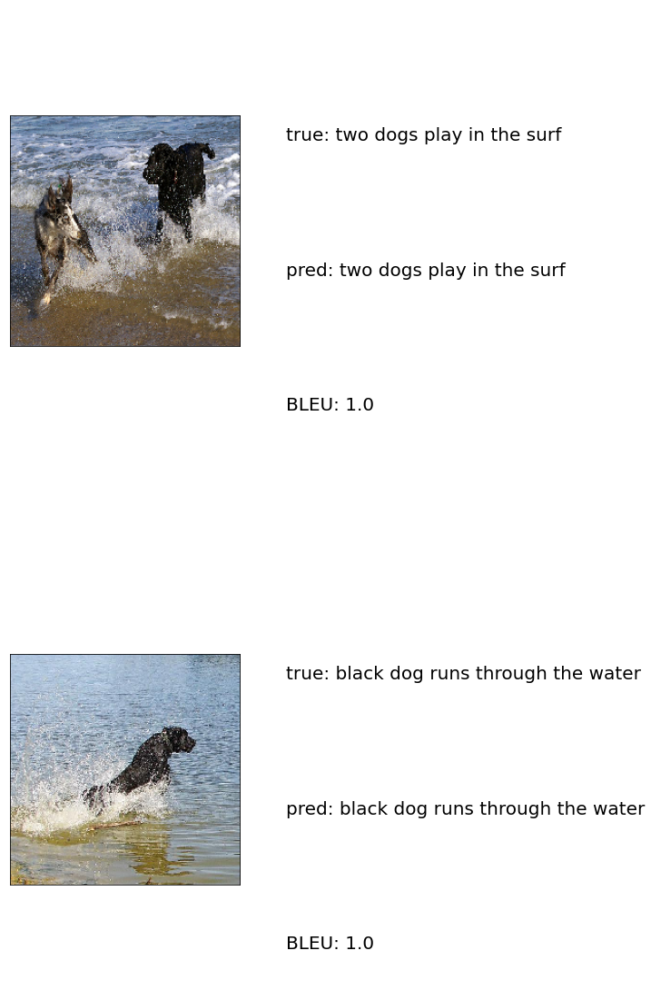

In [39]:
print("Bad Caption VGG16-LSTM_Vanishing")
plot_images(pred_bad_VGG16_LSTM_Vanishing)
print("Good Caption VGG16-LSTM_Vanishing")
plot_images(pred_good_VGG16_LSTM_Vanishing)

Bad Caption VGG16-RNN_Vanishing


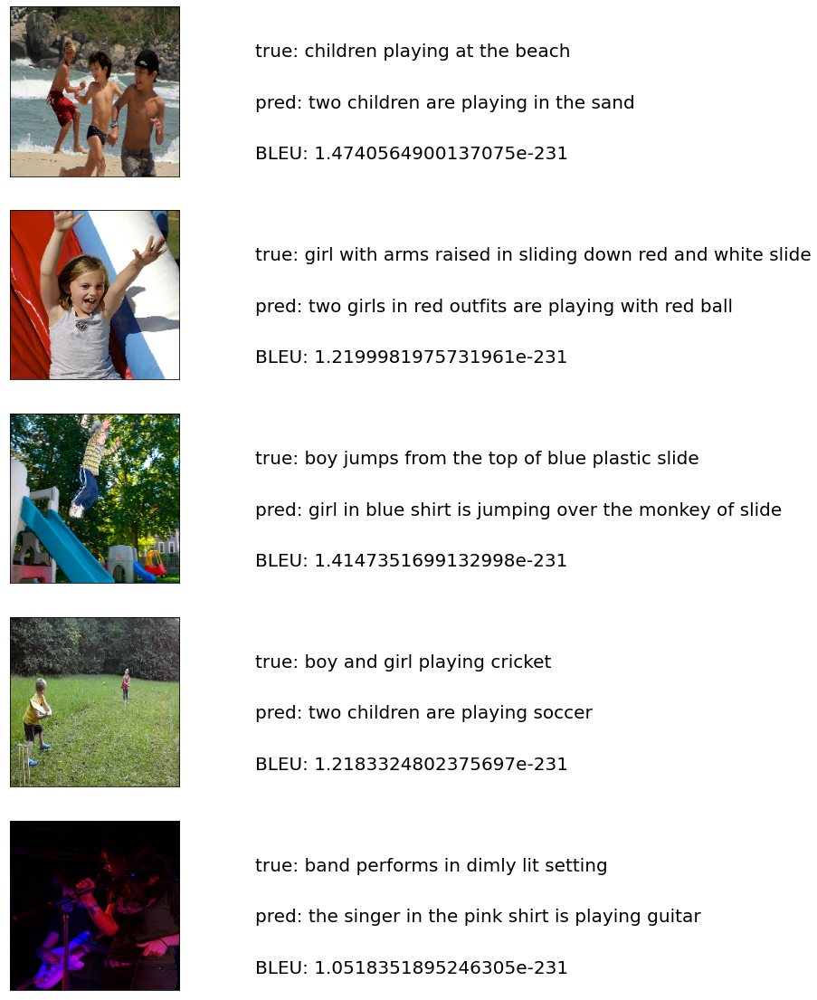

Good Caption VGG16-RNN_Vanishing


<Figure size 720x1440 with 0 Axes>

In [40]:
print("Bad Caption VGG16-RNN_Vanishing")
plot_images(pred_bad_VGG16_RNN_Vanishing)
print("Good Caption VGG16-RNN_Vanishing")
plot_images(pred_good_VGG16_RNN_Vanishing)

Bad Caption DenseNet-LSTM_Vanishing


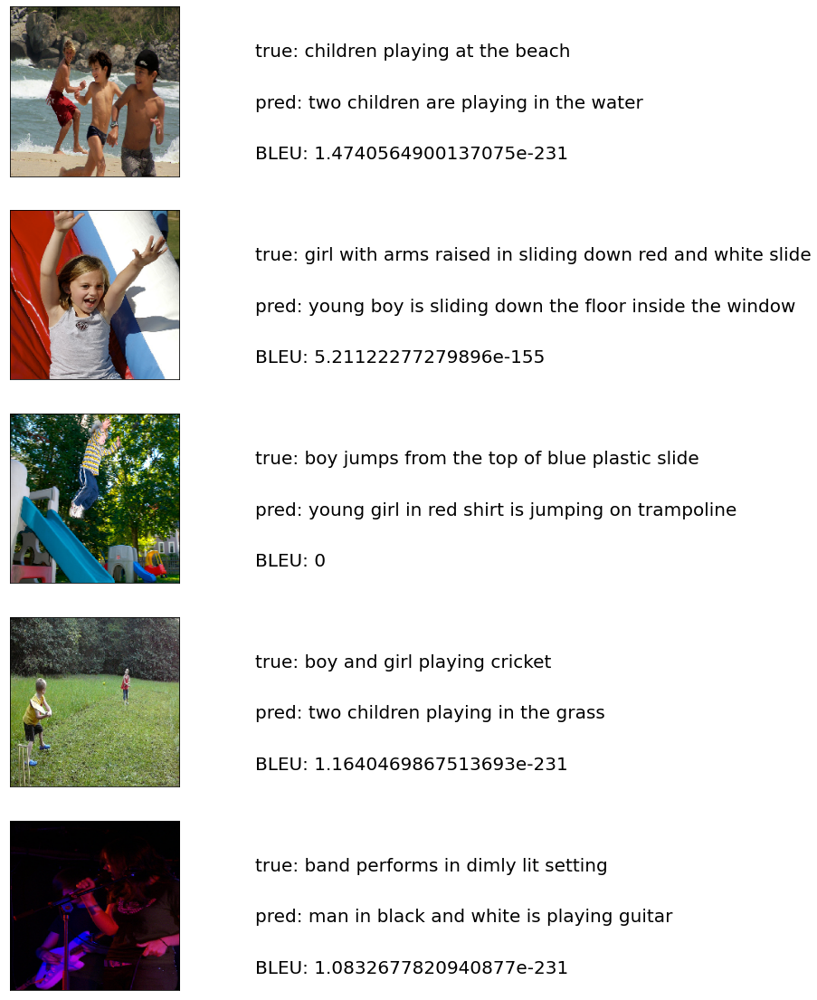

Good Caption DenseNet-LSTM_Vanishing


<Figure size 720x1440 with 0 Axes>

In [41]:
print("Bad Caption DenseNet-LSTM_Vanishing")
plot_images(pred_bad_DenseNet_LSTM_Vanishing)
print("Good Caption DenseNet-LSTM_Vanishing")
plot_images(pred_good_DenseNet_LSTM_Vanishing)

Bad Caption DenseNet-RNN_Vanishing


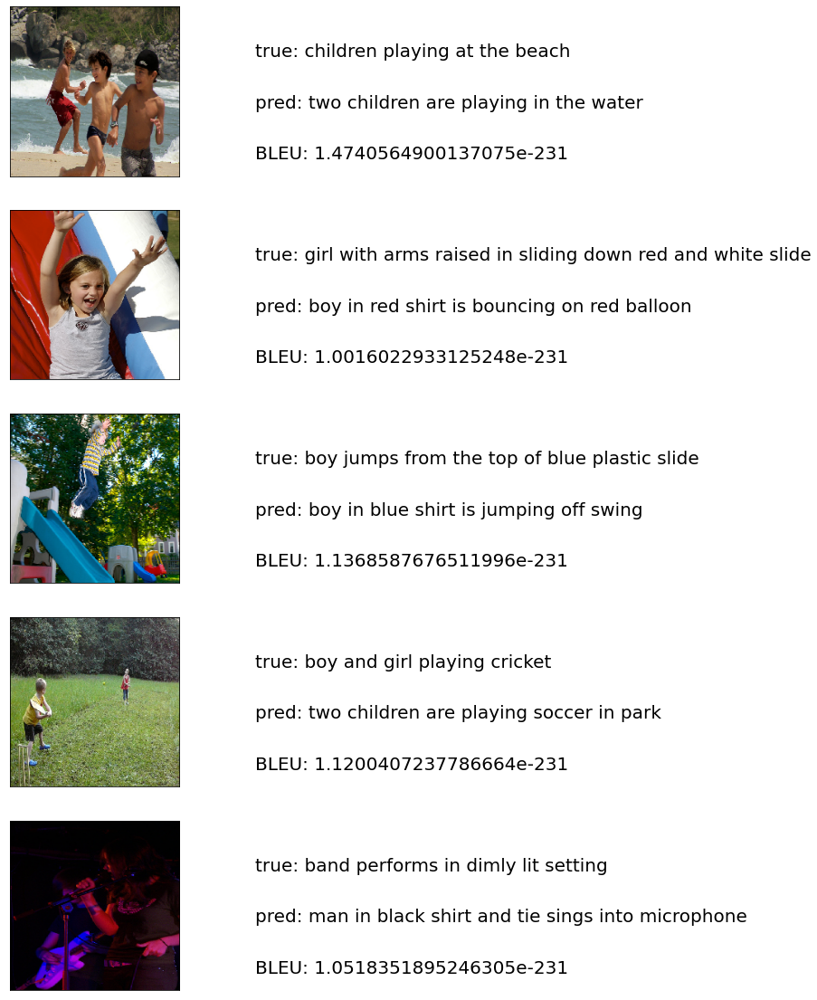

Good Caption DenseNet-RNN_Vanishing


<Figure size 720x1440 with 0 Axes>

In [42]:
print("Bad Caption DenseNet-RNN_Vanishing")
plot_images(pred_bad_DenseNet_RNN_Vanishing)
print("Good Caption DenseNet-RNN_Vanishing")
plot_images(pred_good_DenseNet_RNN_Vanishing)

### BLEU score

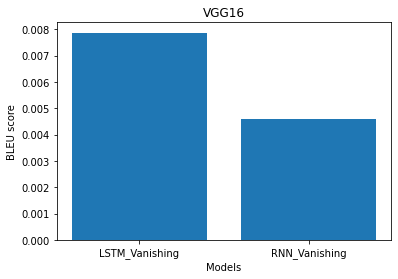

In [43]:
plt.bar(['LSTM_Vanishing', 'RNN_Vanishing'], [np.mean(bleus_VGG16_LSTM_Vanishing), np.mean(bleus_VGG16_RNN_Vanishing)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("VGG16")
plt.show()

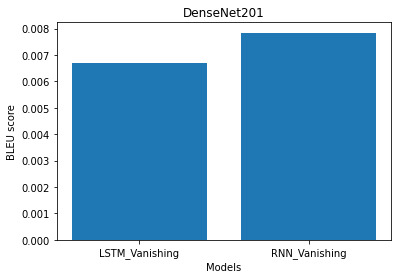

In [44]:
plt.bar(['LSTM_Vanishing', 'RNN_Vanishing'], [np.mean(bleus_DenseNet_LSTM_Vanishing), np.mean(bleus_DenseNet_RNN_Vanishing)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("DenseNet201")
plt.show()

# Compare Model before and after handling

### BLEU score

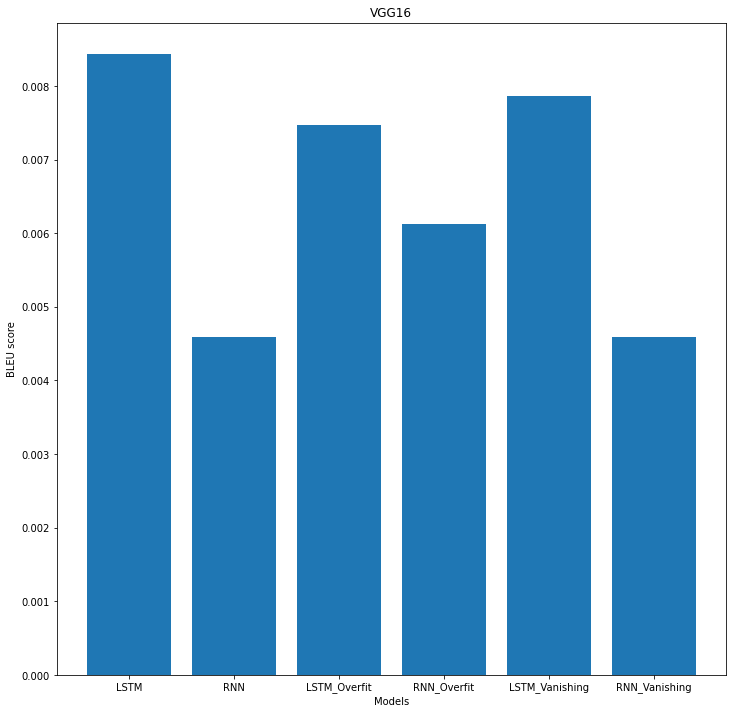

In [47]:
plt.figure(figsize=(12,12))
plt.bar(['LSTM', 'RNN','LSTM_Overfit', 'RNN_Overfit','LSTM_Vanishing', 'RNN_Vanishing'], \
        [np.mean(bleus_VGG16_LSTM), np.mean(bleus_VGG16_RNN), np.mean(bleus_VGG16_LSTM_Overfit), \
         np.mean(bleus_VGG16_RNN_Overfit), np.mean(bleus_VGG16_LSTM_Vanishing), np.mean(bleus_VGG16_RNN_Vanishing)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("VGG16")
plt.show()

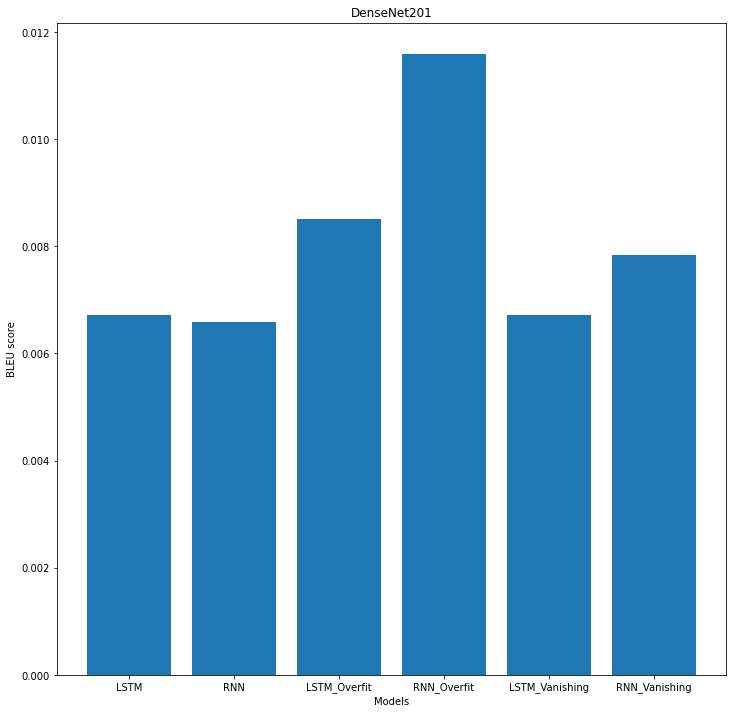

In [48]:
plt.figure(figsize=(12,12))
plt.bar(['LSTM', 'RNN','LSTM_Overfit', 'RNN_Overfit','LSTM_Vanishing', 'RNN_Vanishing'], \
        [np.mean(bleus_DenseNet_LSTM), np.mean(bleus_DenseNet_RNN), np.mean(bleus_DenseNet_LSTM_Overfit), \
         np.mean(bleus_DenseNet_RNN_Overfit), np.mean(bleus_DenseNet_LSTM_Vanishing), np.mean(bleus_DenseNet_RNN_Vanishing)])
plt.xlabel("Models")
plt.ylabel("BLEU score")
plt.title("DenseNet201")
plt.show()